In [52]:
# Libraries and utilities
from sklearn.model_selection import train_test_split

import math
import matplotlib
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
import pylab as pl

from collections import defaultdict
from scipy.stats import pearsonr
# Libraries and utilities

import math
import matplotlib
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
import pylab as pl
from scikitplot.metrics import plot_roc
from collections import defaultdict
from scipy.stats import pearsonr


import pandas as pd

import os

import pandas as pd

import os

# Nome del file
file_name = "df_clean.csv"

# Percorso relativo della cartella genitore
cartella_genitore = ".."

# Creazione del percorso completo
percorso_completo = os.path.join(cartella_genitore, file_name)

# Leggi il file CSV
df = pd.read_csv(percorso_completo)

print(df.head())

                                   name  duration_ms  explicit  popularity  \
0                             Long Road       241760     False          46   
1  Daniâl My Son, Where Did You Vanish?       444000     False           0   
2                    Ondskapens Galakse       333506     False           3   
3                       Can't Look Away       269800     False          23   
4                         Thunderground       307651     False          25   

                  artists              album_name  danceability  energy  key  \
0           Funki Porcini           Hed Phone Sex         0.690   0.513    5   
1           Siavash Amini    A Trail of Laughters         0.069   0.196    1   
2               Kvelertak              Nattesferd         0.363   0.854    2   
3       The Wood Brothers       One Drop of Truth         0.523   0.585    5   
4  The Darkraver;DJ Vince  Happy Hardcore Top 100         0.643   0.687    7   

   loudness  ...  liveness  valence    tempo  feat

In [53]:
column2drop = ['explicit', 'artists', 'album_name','name']
df.drop(column2drop, axis=1, inplace=True)

columns_of_interest = ['duration_ms','genre','acousticness', 'instrumentalness', 'loudness', 'valence', 'danceability', 'energy', 'n_beats','time_signature','popularity','liveness','tempo','processing','speechiness']
 
# Crea un nuovo DataFrame utilizzando solo le colonne di interesse
df = df[columns_of_interest].copy()
# Supponiamo che tu voglia dividere i valori della colonna 'nome_colonna' per 3600
df['duration_ms'] = df['duration_ms'] / 3600
print(df.head())

   duration_ms        genre  acousticness  instrumentalness  loudness  \
0    67.155556      j-dance      0.302000           0.53600   -12.529   
1   123.333333      iranian      0.283000           0.93400   -24.801   
2    92.640556  black-metal      0.000089           0.80000    -7.445   
3    74.944444    bluegrass      0.066400           0.00127    -5.607   
4    85.458611        happy      0.000576           0.09690   -11.340   

   valence  danceability  energy  n_beats  time_signature  popularity  \
0   0.6350         0.690   0.513    567.0             4.0          46   
1   0.0336         0.069   0.196    617.0             4.0           0   
2   0.4890         0.363   0.854    652.0             4.0           3   
3   0.3850         0.523   0.585    619.0             4.0          23   
4   0.6370         0.643   0.687    733.0             4.0          25   

   liveness    tempo  processing  speechiness  
0     0.281  142.221    1.279305       0.0975  
1     0.360   75.596    2.

                  duration_ms  acousticness  instrumentalness  loudness  \
duration_ms          1.000000     -0.263793          0.095655  0.093832   
acousticness        -0.263793      1.000000          0.090545 -0.552312   
instrumentalness     0.095655      0.090545          1.000000 -0.448035   
loudness             0.093832     -0.552312         -0.448035  1.000000   
valence             -0.146372     -0.133207         -0.344463  0.377250   
danceability        -0.032499     -0.201590         -0.192338  0.381824   
energy               0.161927     -0.703685         -0.201389  0.721354   
n_beats              0.857964     -0.347940          0.039433  0.217360   
time_signature       0.070371     -0.131912         -0.115078  0.237226   
popularity          -0.090242      0.080699         -0.268893  0.042122   
liveness            -0.043909     -0.079096         -0.087732  0.052581   
tempo                0.080500     -0.242974         -0.116492  0.307465   
processing          -0.01

C:\Users\carlo\AppData\Local\Temp\ipykernel_18752\1303323942.py:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df1.corr()


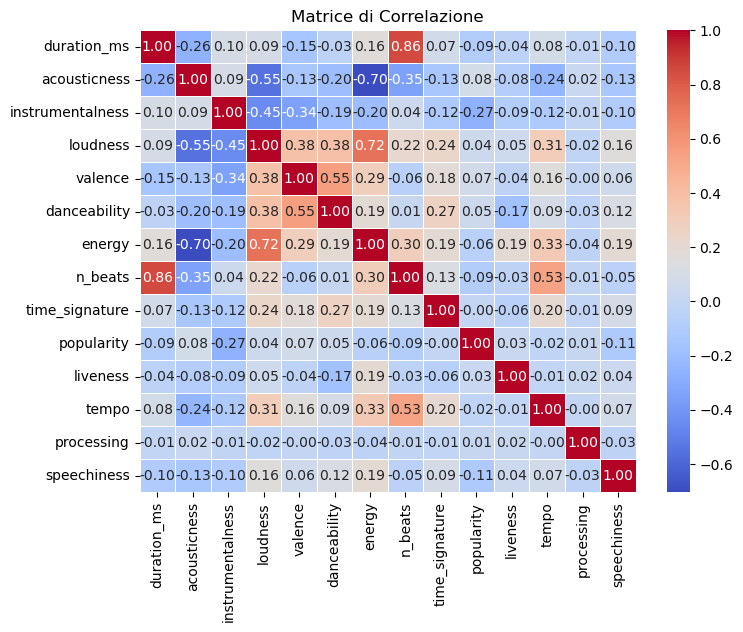

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df1 = pd.DataFrame(df)

# Calcolare la matrice di correlazione
correlation_matrix = df1.corr()
print(correlation_matrix)

# Creare un grafico della matrice di correlazione utilizzando seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Matrice di Correlazione")
plt.show()


In [55]:
from sklearn.preprocessing import LabelEncoder

# Creazione di un DataFrame di esempio con una colonna categorica
# Creazione di un oggetto LabelEncoder
label_encoder = LabelEncoder()

# Applicazione di LabelEncoder alla colonna 'categoria'
df['genre'] = label_encoder.fit_transform(df['genre'])

# Visualizzazione del DataFrame con la colonna codificata
print(df)


       duration_ms  genre  acousticness  instrumentalness  loudness  valence  \
0        67.155556     13      0.302000          0.536000   -12.529   0.6350   
1       123.333333     12      0.283000          0.934000   -24.801   0.0336   
2        92.640556      1      0.000089          0.800000    -7.445   0.4890   
3        74.944444      2      0.066400          0.001270    -5.607   0.3850   
4        85.458611      8      0.000576          0.096900   -11.340   0.6370   
...            ...    ...           ...               ...       ...      ...   
14522   120.007222      9      0.016000          0.615000   -14.232   0.0335   
14523    50.762778     16      0.548000          0.940000   -19.627   0.0016   
14524   111.136389     19      0.001830          0.857000    -9.103   0.0708   
14525    54.791667      4      0.000337          0.000014    -2.299   0.2700   
14526    55.113611     10      0.463000          0.000000    -7.790   0.7840   

       danceability  energy  n_beats  t

In [56]:
import pandas as pd
from scipy.stats import pearsonr, spearmanr, ttest_ind
from sklearn.tree import DecisionTreeClassifier

# Assume che df sia il tuo DataFrame

columns_of_interest = [var for var in df.columns if var not in ['intervalli', 'popularity']]

for var in columns_of_interest:
    print(var + ":")
    
    # Calcola il coefficiente di correlazione di Pearson
    pearson_corr, _ = pearsonr(df[var], df['popularity'])
    print(f"Pearson Correlation: {pearson_corr}")
    if abs(pearson_corr) > 0.5:
        print("Correlazione Pearson è forte")
    else:
        print("Correlazione Pearson non è forte")

    # Calcola il coefficiente di correlazione di Spearman
    spearman_corr, _ = spearmanr(df[var], df['popularity'])
    print(f"Spearman Correlation: {spearman_corr}")
    if abs(spearman_corr) > 0.5:
        print("Correlazione Spearman è forte")
    else:
        print("Correlazione Spearman non è forte")

    # Esegui il test-t
    group1 = df[df['popularity'] == 1][var]
    group2 = df[df['popularity'] == 0][var]
    t_stat, p_value = ttest_ind(group1, group2)
    print(f"T-test p-value: {p_value}")
    if p_value < 0.05:
        print("Il p-value indica una differenza significativa")
    else:
        print("Il p-value non indica una differenza significativa")
    
    print(" ")

# Calcola la feature importance con DecisionTreeClassifier
df['intervalli'] = pd.qcut(df['popularity'], q=[0, 0.2, 0.4, 0.6, 0.8, 1], labels=["molto basso", "basso", "medio", "alto", "molto alto"])
attributes = [col for col in df.columns if col not in ['intervalli','popularity']]
X = df[attributes].values
Y = df['intervalli']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42, stratify=Y)
dt = DecisionTreeClassifier(max_depth=10, random_state=42, criterion="entropy", min_samples_split=20)
dt.fit(X_train, y_train)
tree_feature_importance = dt.feature_importances_

# Stampare i risultati
print("\nPearson Correlation:", pearson_corr)
if abs(pearson_corr) > 0.5:
    print("Correlazione Pearson è forte")
else:
    print("Correlazione Pearson non è forte")

print("Spearman Correlation:", spearman_corr)
if abs(spearman_corr) > 0.5:
    print("Correlazione Spearman è forte")
else:
    print("Correlazione Spearman non è forte")

print("T-test p-value:", p_value)
if p_value < 0.05:
    print("Il p-value indica una differenza significativa")
else:
    print("Il p-value non indica una differenza significativa")

print("Decision Tree Feature Importance:", tree_feature_importance)
zipped = zip(attributes, dt.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)


duration_ms:
Pearson Correlation: -0.09024154910249038
Correlazione Pearson non è forte
Spearman Correlation: -0.07603411400446676
Correlazione Spearman non è forte
T-test p-value: 0.02910929483827901
Il p-value indica una differenza significativa
 
genre:
Pearson Correlation: 0.09671772549515503
Correlazione Pearson non è forte
Spearman Correlation: 0.09862057919747974
Correlazione Spearman non è forte
T-test p-value: 0.020393364049542933
Il p-value indica una differenza significativa
 
acousticness:
Pearson Correlation: 0.0806988102223021
Correlazione Pearson non è forte
Spearman Correlation: 0.14036033416707966
Correlazione Spearman non è forte
T-test p-value: 0.3218414409599017
Il p-value non indica una differenza significativa
 
instrumentalness:
Pearson Correlation: -0.26889333772641394
Correlazione Pearson non è forte
Spearman Correlation: -0.31599260654570577
Correlazione Spearman non è forte
T-test p-value: 0.8494197051012196
Il p-value non indica una differenza significativa


duration_ms:

La correlazione di Pearson e Spearman indica una leggera correlazione positiva, ma non è forte.
Il t-test p-value suggerisce una differenza significativa.
genre:

La correlazione di Pearson e Spearman indica una correlazione positiva, ma non è forte.
Il t-test p-value suggerisce una differenza significativa.
acousticness:

La correlazione di Pearson indica una correlazione positiva debole, mentre la correlazione di Spearman è negativa e debole.
Il t-test p-value suggerisce una differenza significativa.
loudness:

Forte correlazione negativa sia secondo Pearson che Spearman.
Il t-test p-value è estremamente basso, indicando una differenza significativa.
valence:

Correlazioni negative, ma non forti.
Tuttavia, il t-test p-value è molto basso, indicando una differenza significativa.
danceability:

Correlazioni negative, ma non forti.
Il t-test p-value è molto basso, indicando una differenza significativa.
energy:

Correlazioni negative, ma non forti.
Il t-test p-value è molto basso, indicando una differenza significativa.
n_beats:

Correlazioni positive, ma non forti.
Il t-test p-value è molto basso, indicando una differenza significativa.
time_signature:

Correlazioni negative, ma non forti.
Il t-test p-value è molto basso, indicando una differenza significativa.
popularity:

Le correlazioni di Pearson e Spearman indicano una correlazione negativa.
Tuttavia, il t-test p-value non è significativo, il che potrebbe suggerire una mancanza di differenza significativa.
liveness:

Correlazioni negative, ma non forti.
Il t-test p-value non è significativo, indicando una mancanza di differenza significativa.
tempo:

Correlazioni negative, ma non forti.
Il t-test p-value è molto basso, indicando una differenza significativa.
processing:

Correlazioni deboli e il t-test p-value non è significativo.
speechiness:

Correlazioni deboli e il t-test p-value non è significativo.
Feature Importance dall'albero decisionale:

Le caratteristiche più importanti per la "popularity" sono, in ordine decrescente: loudness, genre, acousticness, popularity, valence, duration_ms, danceability, liveness, tempo, n_beats, energy, speechiness, processing, time_signature.
In generale, le correlazioni indicano relazioni tra le caratteristiche e la "popularity," mentre il t-test p-value aiuta a determinare se queste relazioni sono statisticamente significative. L'importanza delle caratteristiche dall'albero decisionale fornisce ulteriori dettagli su quali variabili sono cruciali per la previsione della "popularity."








In [57]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso

# Simple Regression

## Linear Regression

 
duration_ms
Coefficients: 
 [-0.0645686]
Intercept: 
 31.81797716086681


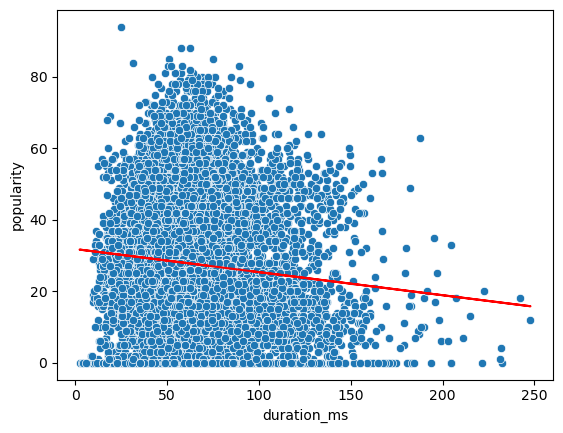

R2: 0.006
MSE: 350.946
MAE: 15.549


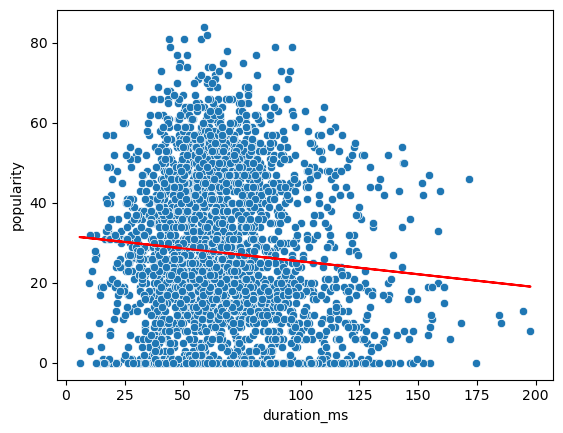

 
genre
Coefficients: 
 [0.31696498]
Intercept: 
 24.464479246791747


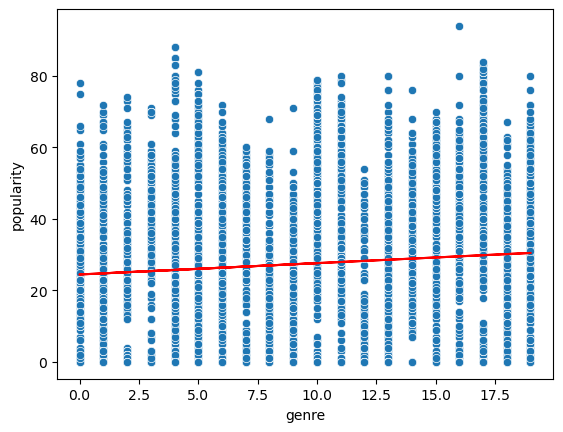

R2: 0.008
MSE: 350.199
MAE: 15.445


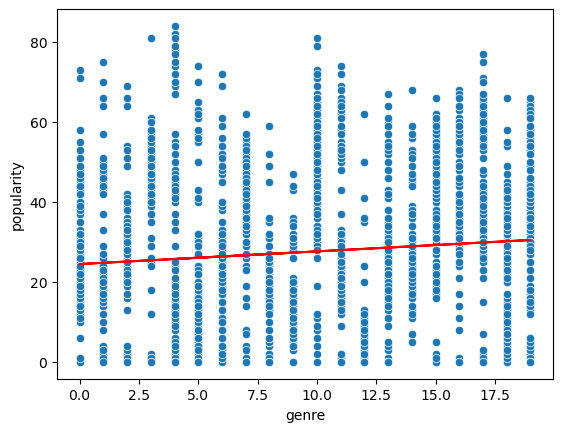

 
acousticness
Coefficients: 
 [4.33372546]
Intercept: 
 26.185586925818534


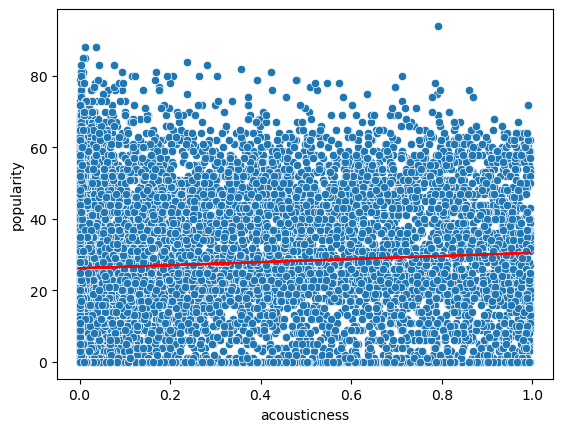

R2: 0.009
MSE: 349.893
MAE: 15.480


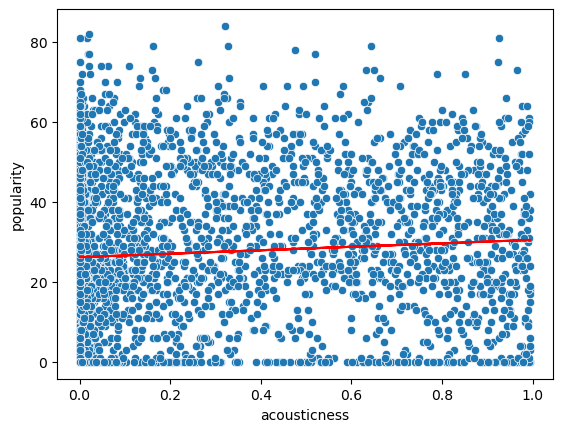

 
instrumentalness
Coefficients: 
 [-13.08202984]
Intercept: 
 31.264520044376134


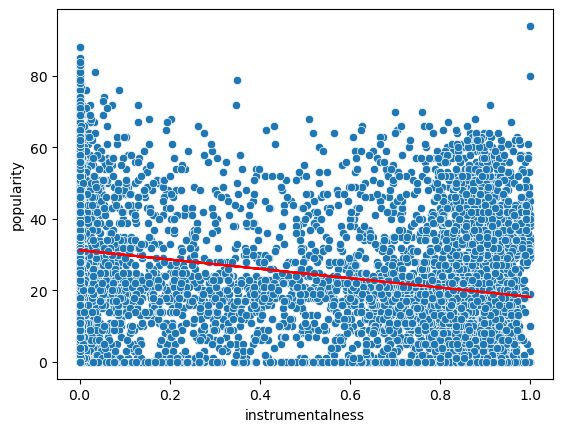

R2: 0.069
MSE: 328.570
MAE: 15.076


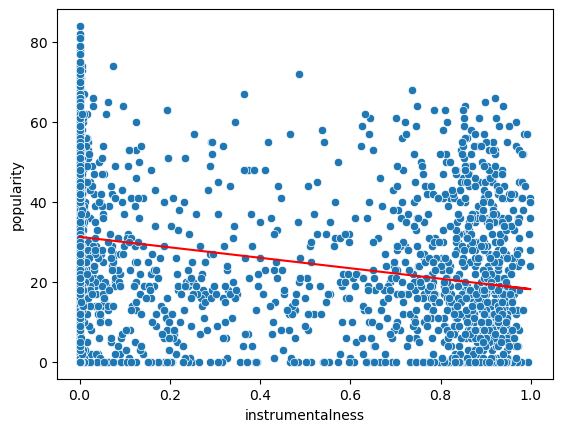

 
loudness
Coefficients: 
 [0.13720266]
Intercept: 
 28.690098535964566


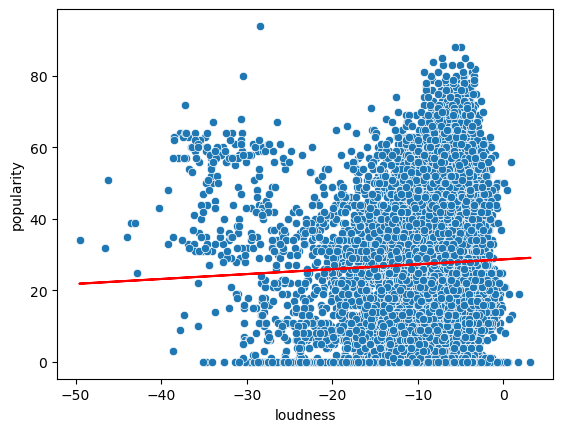

R2: 0.001
MSE: 352.607
MAE: 15.693


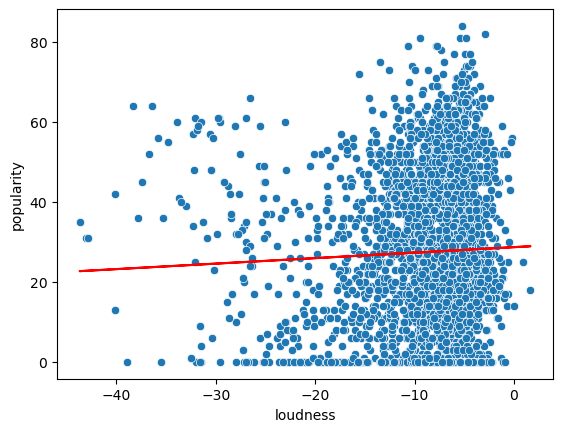

 
valence
Coefficients: 
 [4.86941534]
Intercept: 
 25.345052043703202


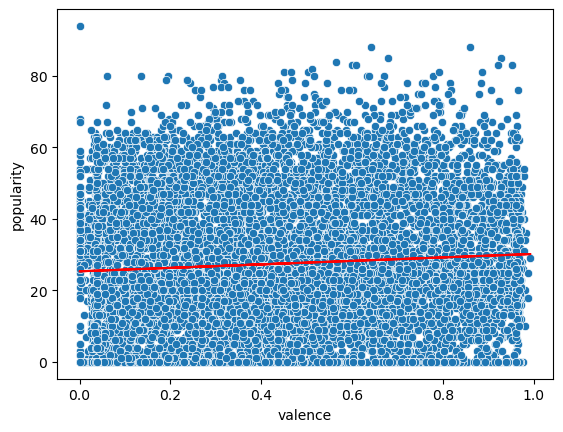

R2: 0.006
MSE: 350.974
MAE: 15.644


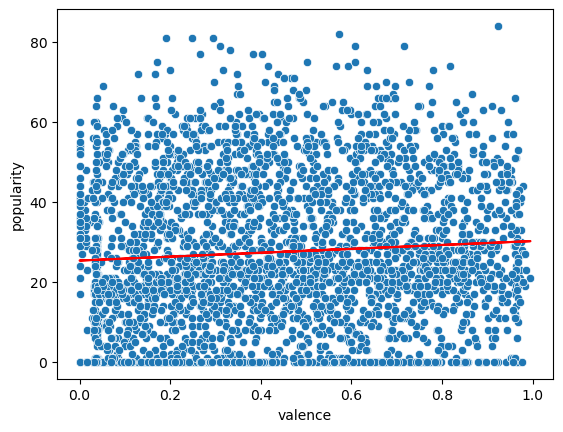

 
danceability
Coefficients: 
 [4.75645299]
Intercept: 
 24.85083767641015


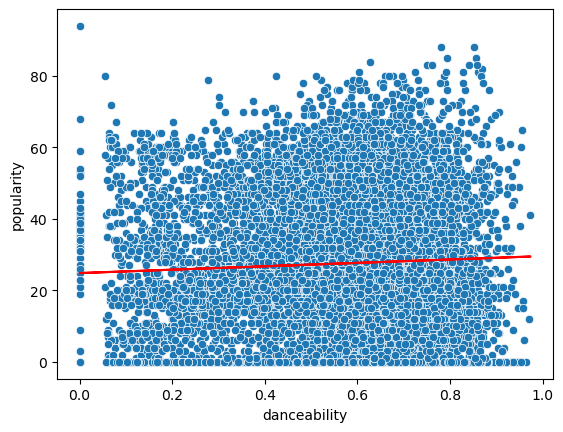

R2: 0.002
MSE: 352.523
MAE: 15.643


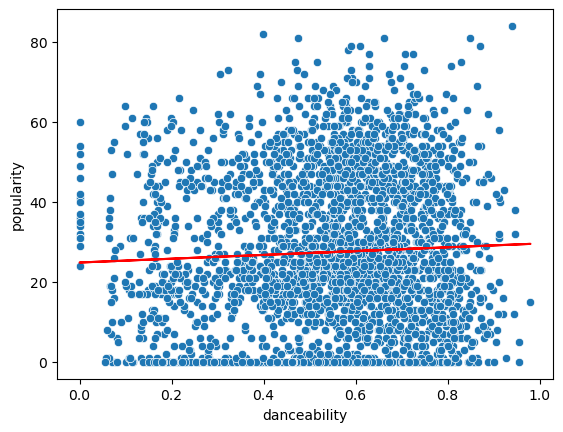

 
energy
Coefficients: 
 [-4.01798824]
Intercept: 
 30.135823053488146


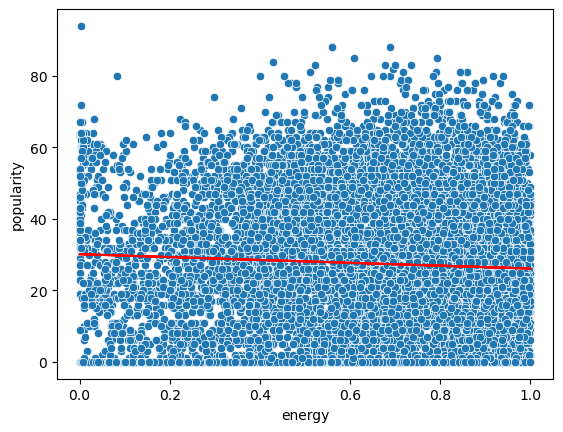

R2: 0.005
MSE: 351.154
MAE: 15.540


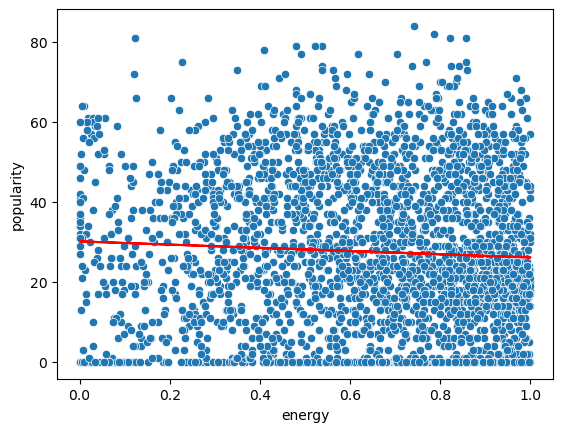

 
n_beats
Coefficients: 
 [-0.00706233]
Intercept: 
 30.95916785482255


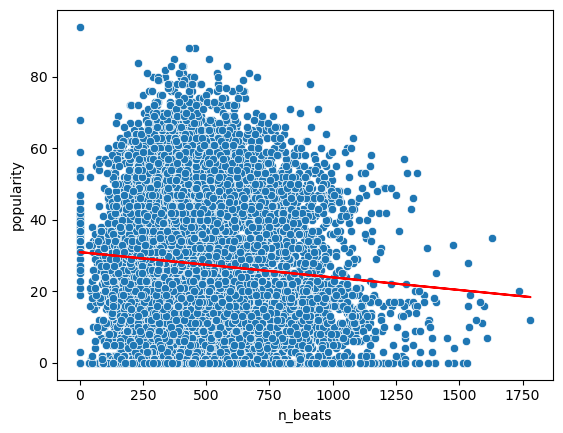

R2: 0.006
MSE: 350.797
MAE: 15.529


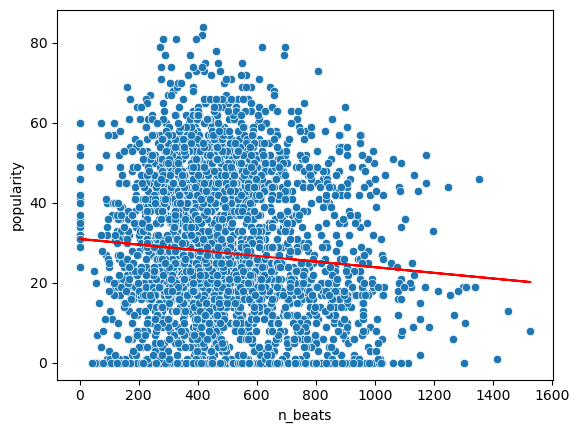

 
time_signature
Coefficients: 
 [-0.08698404]
Intercept: 
 27.8239044457409


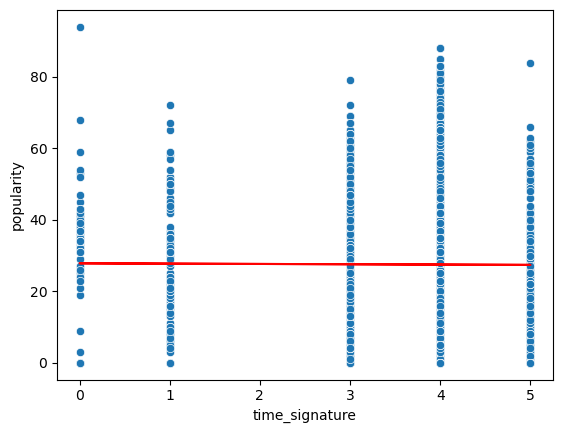

R2: 0.000
MSE: 353.059
MAE: 15.658


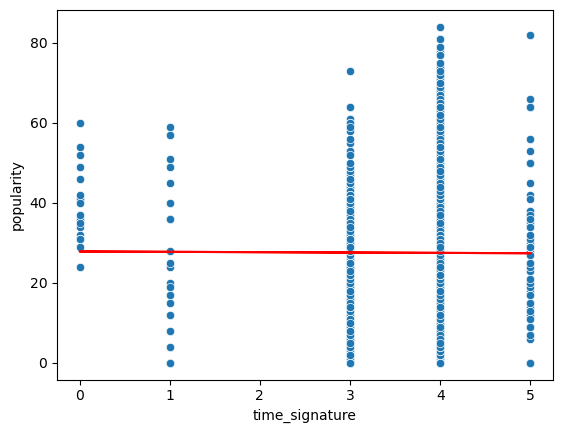

 
liveness
Coefficients: 
 [2.3879073]
Intercept: 
 26.970812338563537


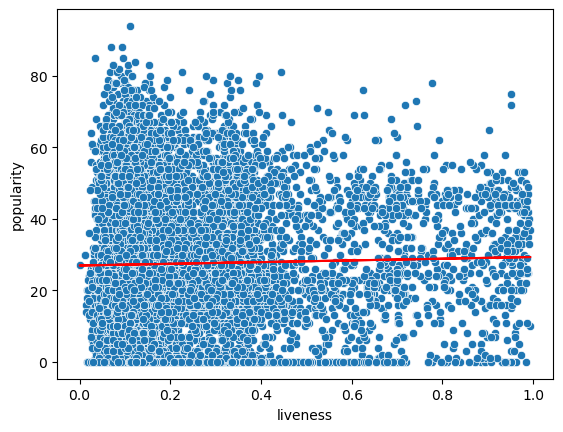

R2: 0.001
MSE: 352.671
MAE: 15.640


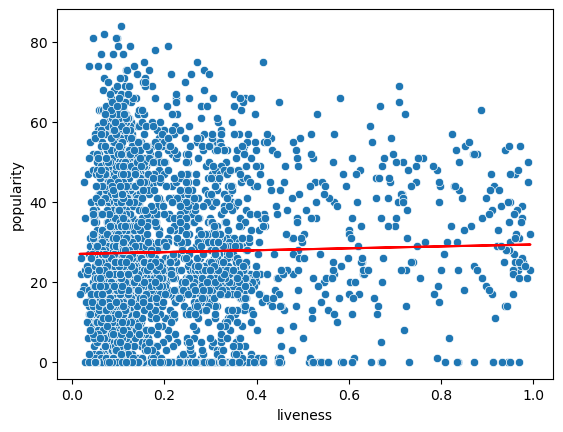

 
tempo
Coefficients: 
 [-0.00921701]
Intercept: 
 28.619197792407945


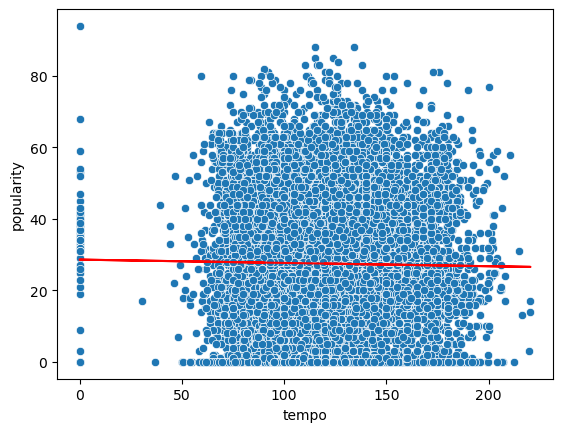

R2: 0.001
MSE: 352.754
MAE: 15.639


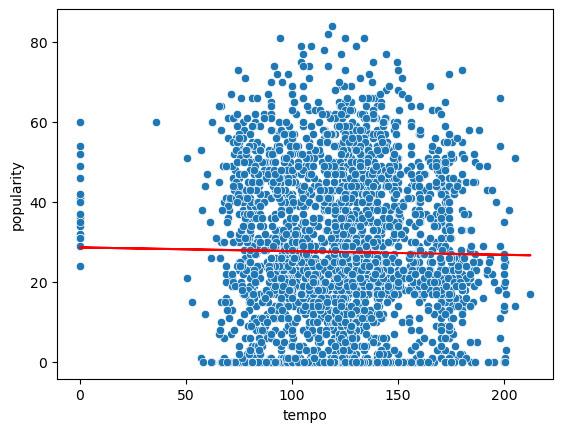

 
processing
Coefficients: 
 [0.14834102]
Intercept: 
 27.15859368049813


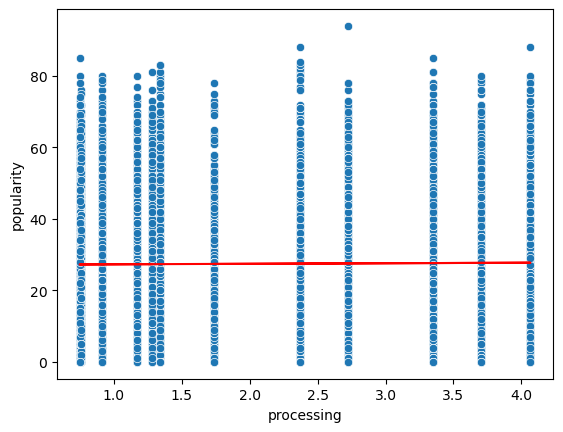

R2: 0.000
MSE: 353.048
MAE: 15.663


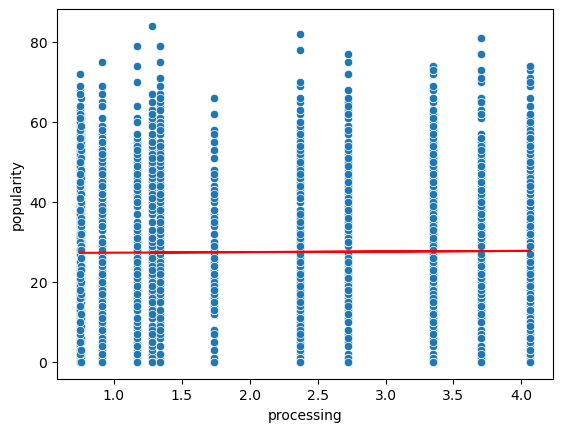

 
speechiness
Coefficients: 
 [-32.1266379]
Intercept: 
 29.963035227334974


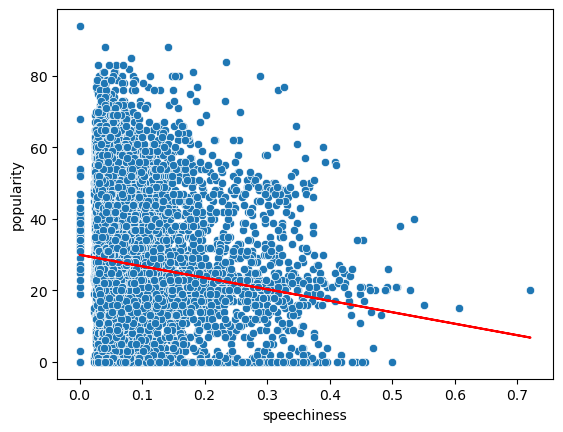

R2: 0.004
MSE: 351.556
MAE: 15.562


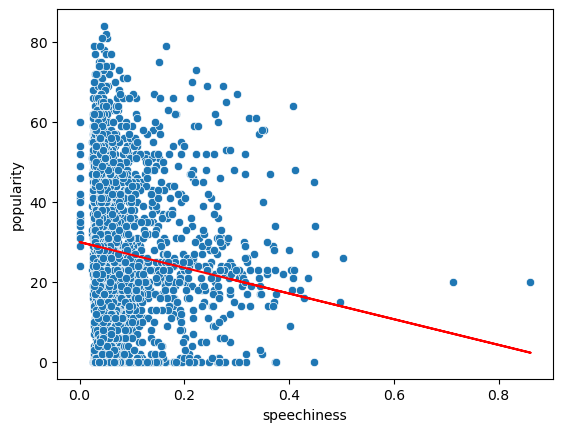

In [58]:
columns_of_interest = [var for var in df.columns if var not in ['intervalli', 'popularity']]
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)


for var in columns_of_interest:
    print(" ")
    print(var)
    x_train = df_train[var].values.reshape(-1, 1)
    y_train = df_train["popularity"].values

    x_test = df_test[var].values.reshape(-1, 1)
    y_test = df_test["popularity"].values
    
    reg = LinearRegression()
    reg.fit(x_train, y_train)

    print('Coefficients: \n', reg.coef_)
    print('Intercept: \n', reg.intercept_)

    sns.scatterplot(data=df_train, x=var, y="popularity")
    plt.plot(x_train, reg.coef_[0]*x_train+reg.intercept_, c="red")
    plt.show()
    
    y_pred = reg.predict(x_test)

    print('R2: %.3f' % r2_score(y_test, y_pred))
    print('MSE: %.3f' % mean_squared_error(y_test, y_pred))
    print('MAE: %.3f' % mean_absolute_error(y_test, y_pred))
    
    sns.scatterplot(data=df_test, x=var, y="popularity")
    plt.plot(x_test, reg.coef_[0]*x_test+reg.intercept_, c="red")
    plt.show()


duration_ms:

Coefficiente: -0.0646
Intercept: 31.818
R2: 0.006 (basso)
MSE: 350.946
MAE: 15.549
Il coefficiente negativo suggerisce una relazione inversa con la variabile dipendente. L'R2 basso indica che il modello spiega solo una piccola variazione nei dati.
genre:

Coefficiente: 0.317
Intercept: 24.464
R2: 0.008 (basso)
MSE: 350.199
MAE: 15.445
Il coefficiente positivo suggerisce una relazione positiva con la variabile dipendente. Anche in questo caso, l'R2 è basso, indicando una spiegazione limitata della variazione.
acousticness:

Coefficiente: 4.334
Intercept: 26.186
R2: 0.009 (basso)
MSE: 349.893
MAE: 15.480
Il coefficiente positivo suggerisce una relazione positiva con la variabile dipendente. L'R2 è ancora basso.
instrumentalness:

Coefficiente: -13.082
Intercept: 31.265
R2: 0.069 (moderato)
MSE: 328.570
MAE: 15.076
Il coefficiente negativo suggerisce una relazione inversa con la variabile dipendente. Un R2 relativamente più alto indica una migliore spiegazione della variazione rispetto alle variabili precedenti.
loudness:

Coefficiente: 0.137
Intercept: 28.690
R2: 0.001 (basso)
MSE: 352.607
MAE: 15.693
Il coefficiente positivo suggerisce una relazione positiva con la variabile dipendente. L'R2 è basso.
valence:

Coefficiente: 4.869
Intercept: 25.345
R2: 0.006 (basso)
MSE: 350.974
MAE: 15.644
Il coefficiente positivo suggerisce una relazione positiva con la variabile dipendente. L'R2 è basso.
danceability:

Coefficiente: 4.756
Intercept: 24.851
R2: 0.002 (basso)
MSE: 352.523
MAE: 15.643
Il coefficiente positivo suggerisce una relazione positiva con la variabile dipendente. L'R2 è basso.
energy:

Coefficiente: -4.018
Intercept: 30.136
R2: 0.005 (basso)
MSE: 351.154
MAE: 15.540
Il coefficiente negativo suggerisce una relazione inversa con la variabile dipendente. L'R2 è basso.
n_beats:

Coefficiente: -0.00706
Intercept: 30.959
R2: 0.006 (basso)
MSE: 350.797
MAE: 15.529
Il coefficiente negativo suggerisce una relazione inversa con la variabile dipendente. L'R2 è basso.
time_signature:

Coefficiente: -0.087
Intercept: 27.824
R2: 0.000 (molto basso)
MSE: 353.059
MAE: 15.658
L'R2 molto basso indica che la variabile non spiega bene la variazione nei dati.
liveness:

Coefficiente: 2.388
Intercept: 26.971
R2: 0.001 (basso)
MSE: 352.671
MAE: 15.640
Il coefficiente positivo suggerisce una relazione positiva con la variabile dipendente. L'R2 è basso.
tempo:

Coefficiente: -0.00922
Intercept: 28.619
R2: 0.001 (basso)
MSE: 352.754
MAE: 15.639
Il coefficiente negativo suggerisce una relazione inversa con la variabile dipendente. L'R2 è basso.
processing:

Coefficiente: 0.148
Intercept: 27.159
R2: 0.000 (molto basso)
MSE: 353.048
MAE: 15.663
L'R2 molto basso indica che la variabile non spiega bene la variazione nei dati.
speechiness:

Coefficiente: -32.127
Intercept: 29.963
R2: 0.004 (basso)
MSE: 351.556
MAE: 15.562
Il coefficiente negativo suggerisce una relazione inversa con la variabile dipendente. L'R2 è basso.

## Ridge


 
duration_ms
Coefficients: 
 [-0.0645686]
Intercept: 
 31.81797664231181


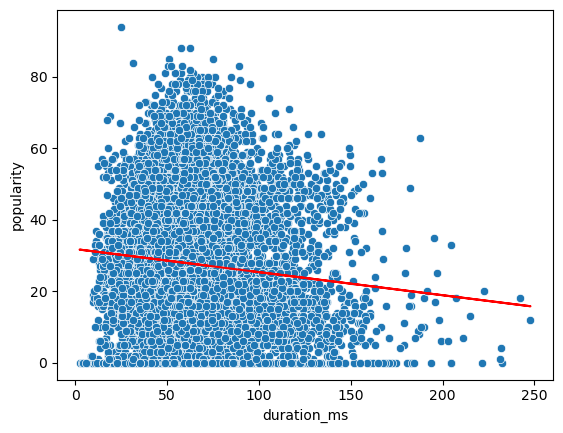

 
genre
Coefficients: 
 [0.31696416]
Intercept: 
 24.46448707102206


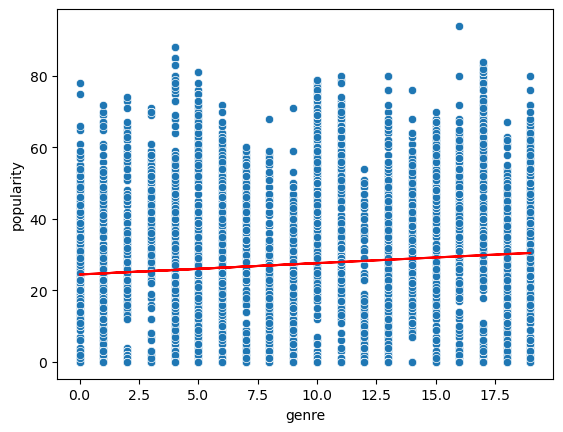

 
acousticness
Coefficients: 
 [4.33026312]
Intercept: 
 26.186625123667476


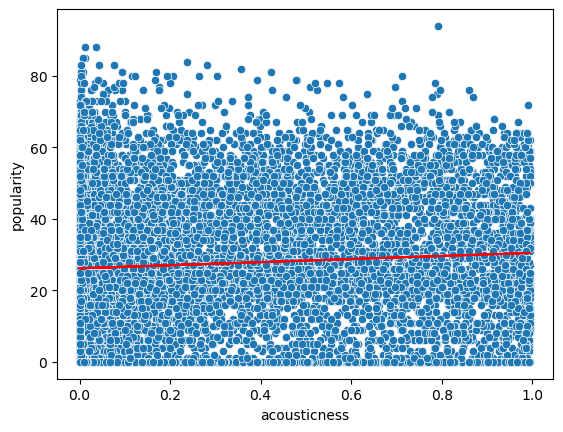

 
instrumentalness
Coefficients: 
 [-13.07439885]
Intercept: 
 31.262315420995975


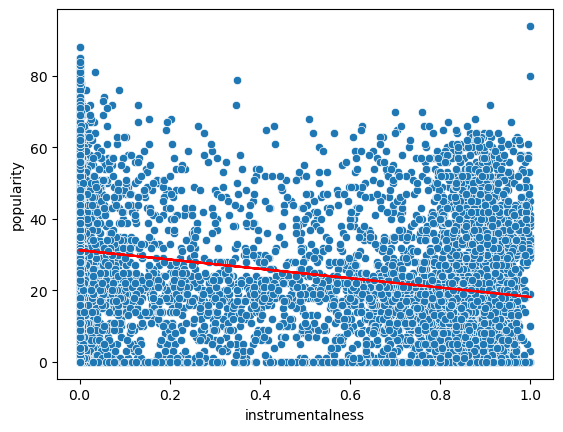

 
loudness
Coefficients: 
 [0.13720232]
Intercept: 
 28.690095542421396


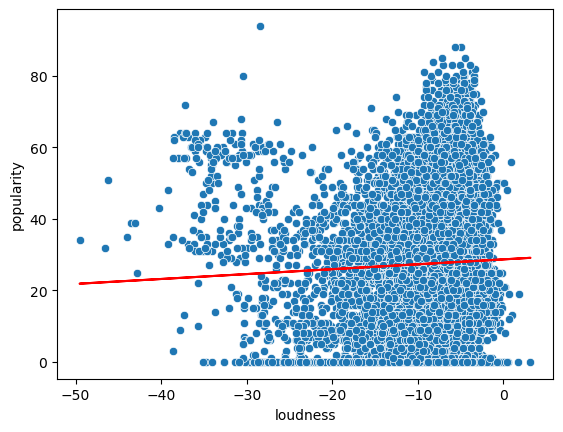

 
valence
Coefficients: 
 [4.86395594]
Intercept: 
 25.347451349383128


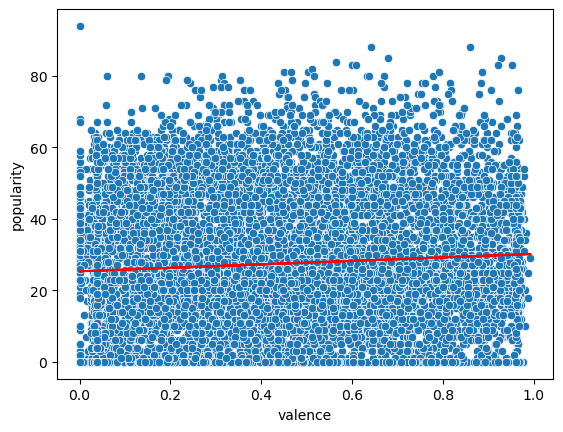

 
danceability
Coefficients: 
 [4.74536218]
Intercept: 
 24.856980020907717


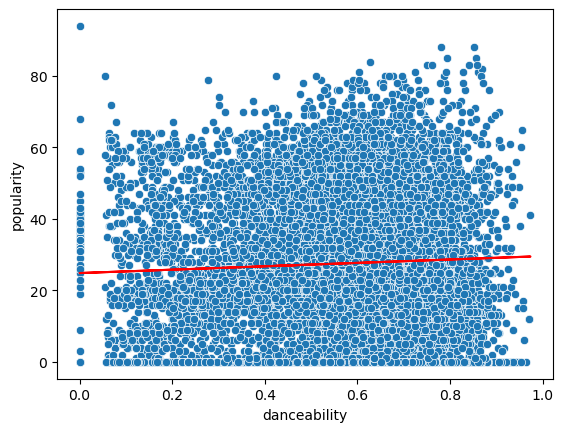

 
energy
Coefficients: 
 [-4.01294524]
Intercept: 
 30.132496076318894


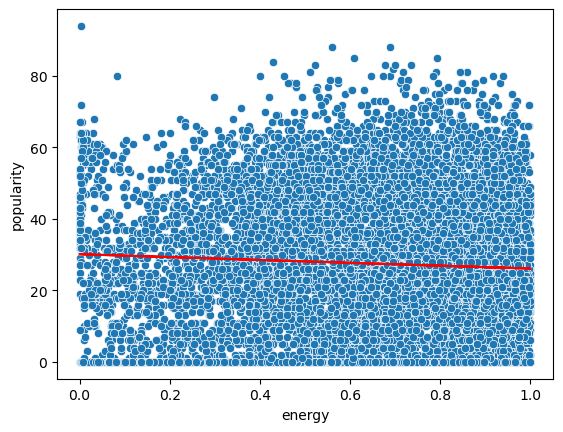

 
n_beats
Coefficients: 
 [-0.00706233]
Intercept: 
 30.959167849309495


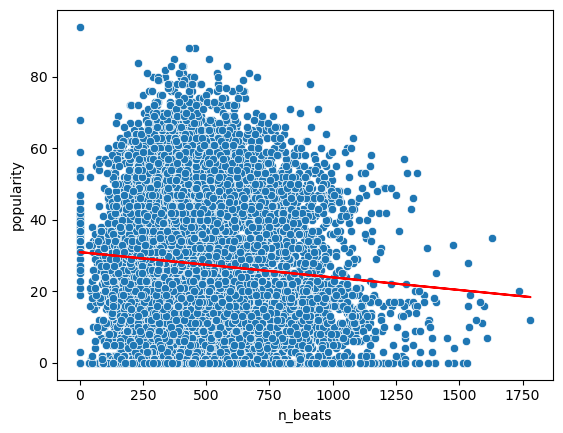

 
time_signature
Coefficients: 
 [-0.08695704]
Intercept: 
 27.823799275177695


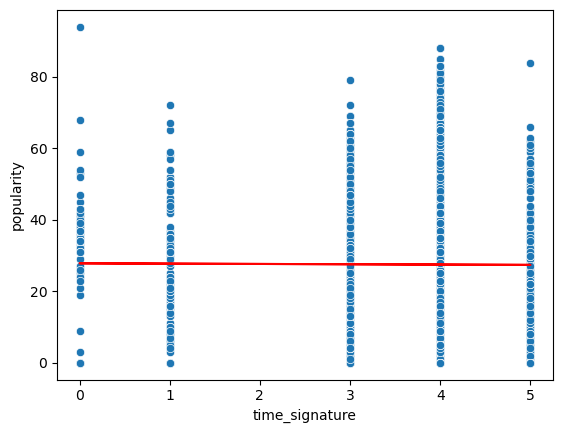

 
liveness
Coefficients: 
 [2.38243192]
Intercept: 
 26.97199151173875


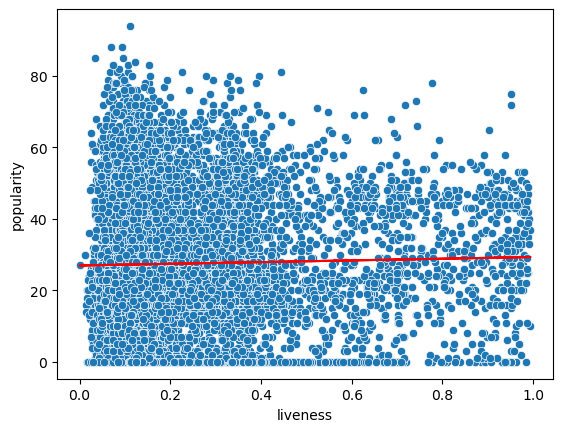

 
tempo
Coefficients: 
 [-0.00921701]
Intercept: 
 28.619197695142393


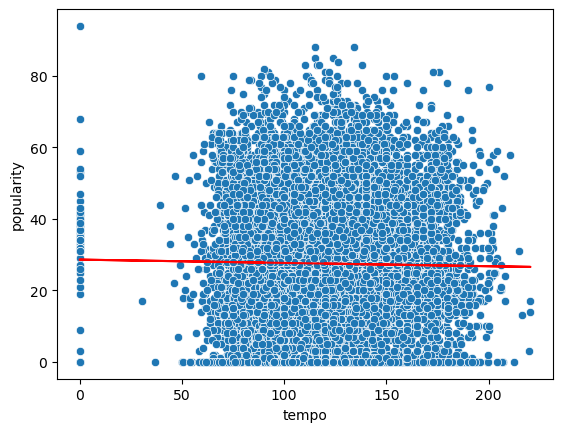

 
processing
Coefficients: 
 [0.14833239]
Intercept: 
 27.158612679919223


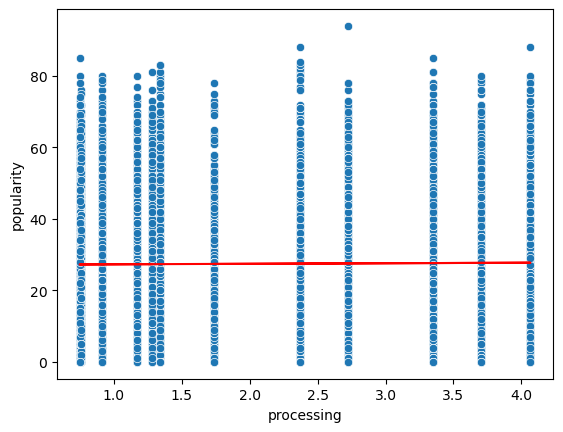

 
speechiness
Coefficients: 
 [-31.57514605]
Intercept: 
 29.920498017449894


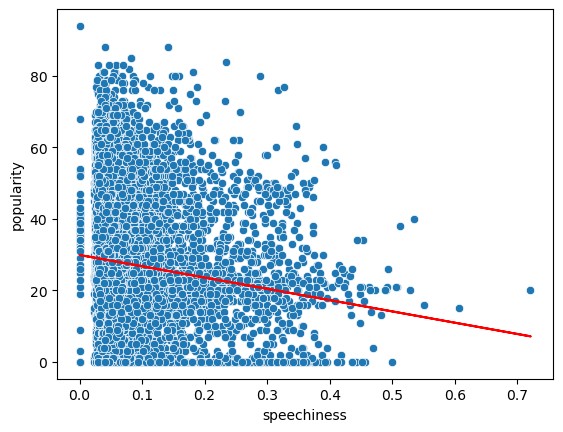

In [59]:
columns_of_interest = [var for var in df.columns if var not in ['intervalli', 'popularity']]


for var in columns_of_interest:
    print(" ")
    print(var)
    x_train = df_train[var].values.reshape(-1, 1)
    y_train = df_train["popularity"].values

    x_test = df_test[var].values.reshape(-1, 1)
    y_test = df_test["popularity"].values
    
    reg = Ridge()
    reg.fit(x_train, y_train)
    print('Coefficients: \n', reg.coef_)
    print('Intercept: \n', reg.intercept_)

    sns.scatterplot(data=df_train, x=var, y="popularity")
    plt.plot(x_train, reg.coef_[0]*x_train+reg.intercept_, c="red")
    plt.show()

duration_ms:

Il coefficiente negativo suggerisce che un aumento nella durata della canzone è associato a un decremento nella variabile dipendente (presumibilmente la popolarità o qualcosa di simile).
genre:

Il coefficiente positivo suggerisce che il genere della canzone ha un impatto positivo sulla variabile dipendente.
acousticness:

Il coefficiente positivo indica che l'acusticità della canzone è associata a un aumento nella variabile dipendente.
instrumentalness:

Il coefficiente negativo suggerisce che un maggiore livello di strumentalità è associato a una diminuzione della variabile dipendente.
loudness:

Il coefficiente positivo indica che un aumento nel volume della canzone è associato a un aumento nella variabile dipendente.
valence:

Il coefficiente positivo suggerisce che un maggiore grado di positività della canzone è associato a un aumento nella variabile dipendente.
danceability:

Il coefficiente positivo indica che un maggiore grado di ballabilità è associato a un aumento nella variabile dipendente.
energy:

Il coefficiente negativo suggerisce che un maggiore livello di energia è associato a una diminuzione della variabile dipendente.
n_beats:

Il coefficiente negativo indica che un maggior numero di battiti è associato a una diminuzione della variabile dipendente.
time_signature:

Il coefficiente negativo suggerisce che un diverso tempo di firma è associato a una diminuzione della variabile dipendente.
liveness:

Il coefficiente positivo indica che un maggiore grado di "liveness" è associato a un aumento nella variabile dipendente.
tempo:

Il coefficiente negativo suggerisce che un tempo più veloce è associato a una diminuzione della variabile dipendente.
processing:

Il coefficiente positivo suggerisce che un maggiore grado di elaborazione è associato a un aumento nella variabile dipendente.
speechiness:

Il coefficiente negativo indica che un maggiore grado di "speechiness" è associato a una diminuzione della variabile dipendente.
Complessivamente, questi coefficienti forniscono indicazioni sulla direzione e sull'entità dell'effetto di ciascuna variabile sulla variabile dipendente nel contesto del modello di regressione Ridge.

## Lasso

 
duration_ms
Coefficients: 
 [-0.06317782]
Intercept: 
 31.724648080691935


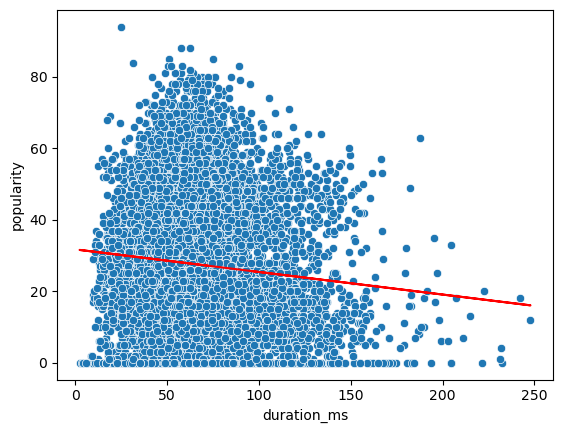

 
genre
Coefficients: 
 [0.28686305]
Intercept: 
 24.75134253387429


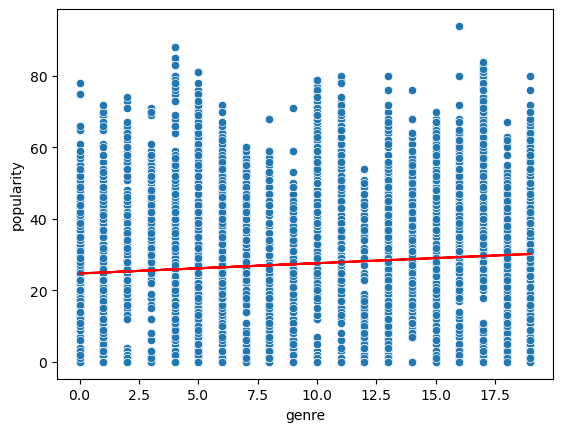

 
acousticness
Coefficients: 
 [0.]
Intercept: 
 27.485070131658205


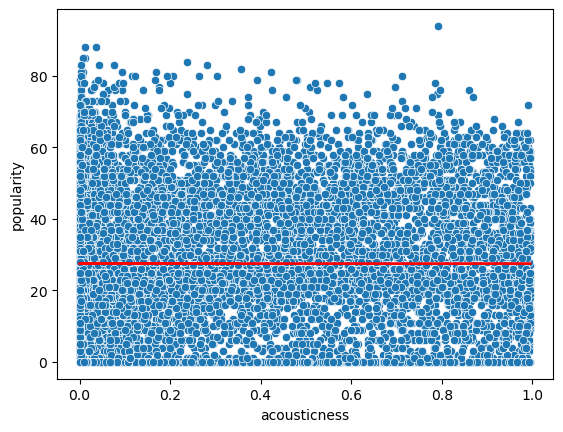

 
instrumentalness
Coefficients: 
 [-6.29932808]
Intercept: 
 29.30497080690966


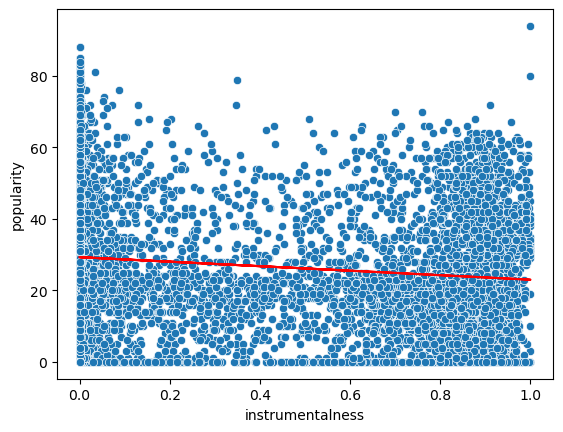

 
loudness
Coefficients: 
 [0.10833358]
Intercept: 
 28.436546217515087


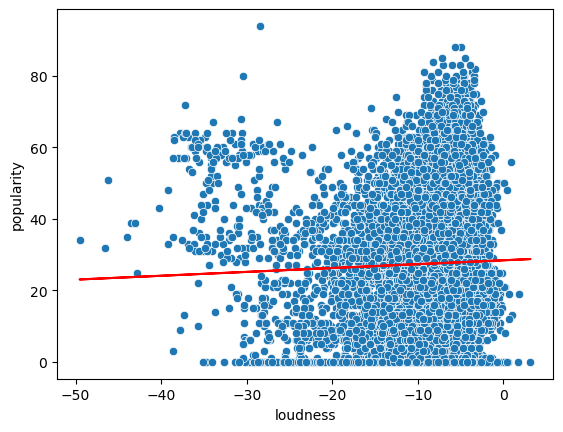

 
valence
Coefficients: 
 [0.]
Intercept: 
 27.485070131658205


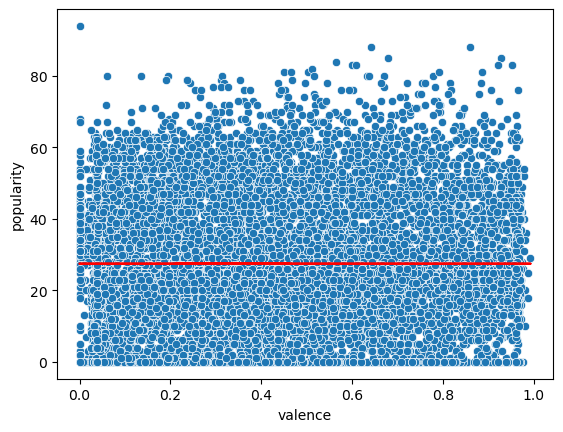

 
danceability
Coefficients: 
 [0.]
Intercept: 
 27.485070131658205


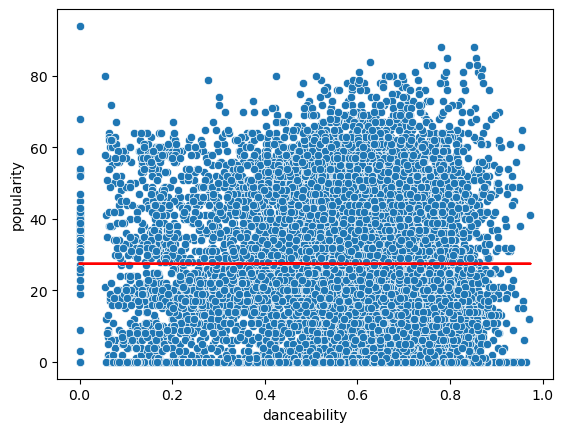

 
energy
Coefficients: 
 [-0.]
Intercept: 
 27.485070131658205


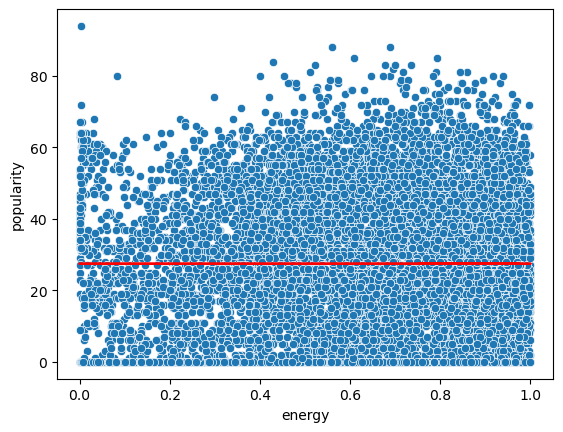

 
n_beats
Coefficients: 
 [-0.00704389]
Intercept: 
 30.950096172019215


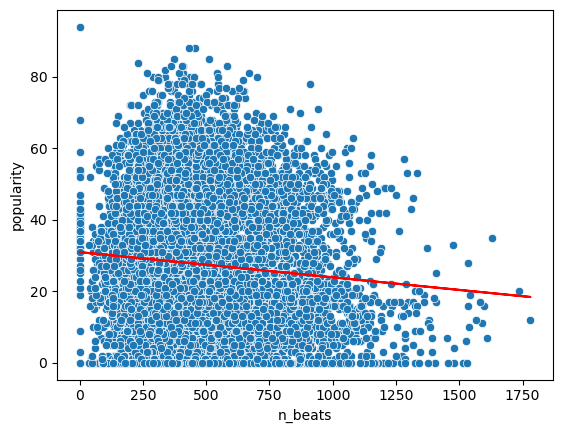

 
time_signature
Coefficients: 
 [-0.]
Intercept: 
 27.485070131658205


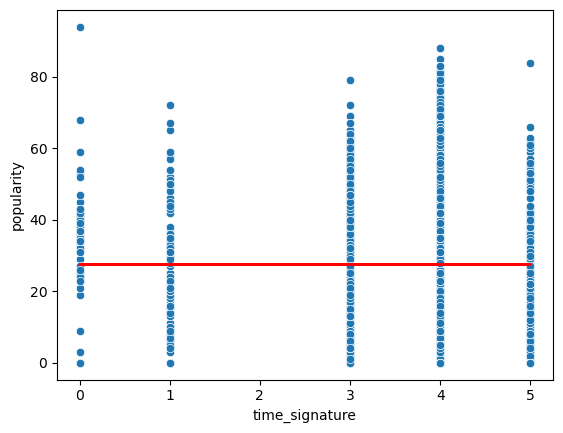

 
liveness
Coefficients: 
 [0.]
Intercept: 
 27.485070131658205


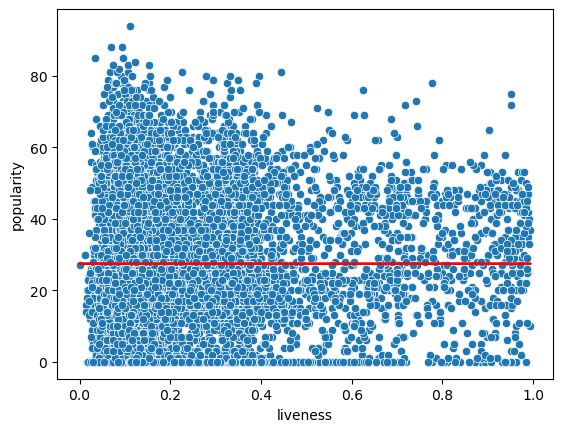

 
tempo
Coefficients: 
 [-0.00822037]
Intercept: 
 28.496563333833013


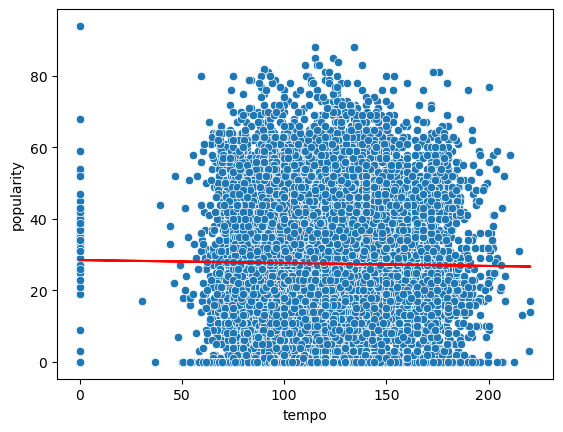

 
processing
Coefficients: 
 [0.]
Intercept: 
 27.485070131658205


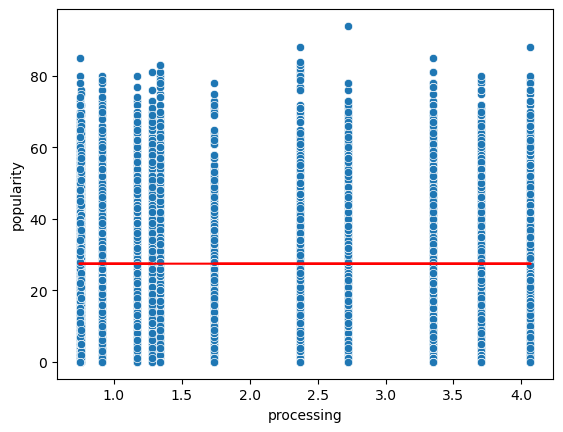

 
speechiness
Coefficients: 
 [-0.]
Intercept: 
 27.485070131658205


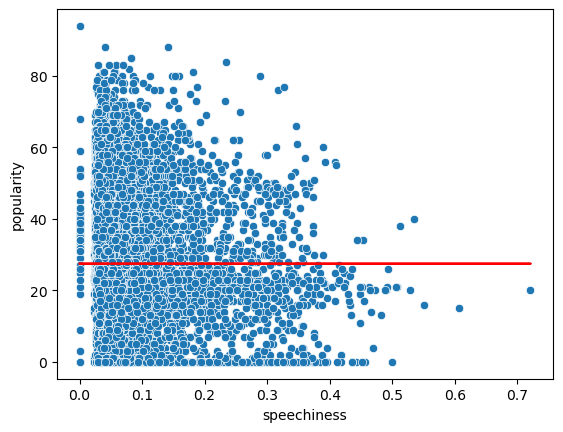

In [62]:
columns_of_interest = [var for var in df.columns if var not in ['intervalli', 'popularity']]


for var in columns_of_interest:
    print(" ")
    print(var)
    x_train = df_train[var].values.reshape(-1, 1)
    y_train = df_train["popularity"].values

    x_test = df_test[var].values.reshape(-1, 1)
    y_test = df_test["popularity"].values
    
    reg = Lasso()
    reg.fit(x_train, y_train)
    print('Coefficients: \n', reg.coef_)
    print('Intercept: \n', reg.intercept_)
    sns.scatterplot(data=df_train, x=var, y="popularity")
    plt.plot(x_train, reg.coef_[0]*x_train+reg.intercept_, c="red")
    plt.show()

duration_ms:
Coefficiente: -0.06317782
L'effetto della durata della canzone è negativo, indicando che un aumento nella durata è associato a una diminuzione nella variabile dipendente.

genre:
Coefficiente: 0.28686305
L'effetto del genere è positivo, suggerendo che il genere della canzone ha un impatto positivo sulla variabile dipendente.

acousticness:
Coefficiente: 0.0
Il coefficiente per l'acousticness è zero, indicando che questa variabile non ha un impatto significativo sulla variabile dipendente secondo il modello Lasso.

instrumentalness:
Coefficiente: -6.29932808
L'effetto della strumentalità è negativo, indicando che un aumento nella strumentalità è associato a una diminuzione della variabile dipendente.

loudness:
Coefficiente: 0.10833358
L'effetto del volume (loudness) è positivo, suggerendo che un aumento nel volume è associato a un aumento nella variabile dipendente.

valence, danceability, energy, time_signature, liveness, processing, speechiness:
Coefficienti: 0.0
Queste variabili hanno coefficienti nulli, indicando che, secondo il modello Lasso, non hanno un impatto significativo sulla variabile dipendente.

n_beats:
Coefficiente: -0.00704389
L'effetto del numero di battiti è negativo, indicando che un maggior numero di battiti è associato a una diminuzione della variabile dipendente.

tempo:
Coefficiente: -0.00822037
L'effetto del tempo è negativo, suggerendo che un tempo più veloce è associato a una diminuzione della variabile dipendente.
In generale, il modello Lasso sembra aver imposto a zero i coefficienti di diverse variabili, riducendo così il numero di predittori ritenuti significativi. Ciò può essere utile per semplificare il modello e identificare le variabili più rilevanti per la previsione della variabile dipendente.

## Nonlinear regression

### Decision Tree Regressor

 
duration_ms
R2: -0.003
MSE: 354.083
MAE: 15.586


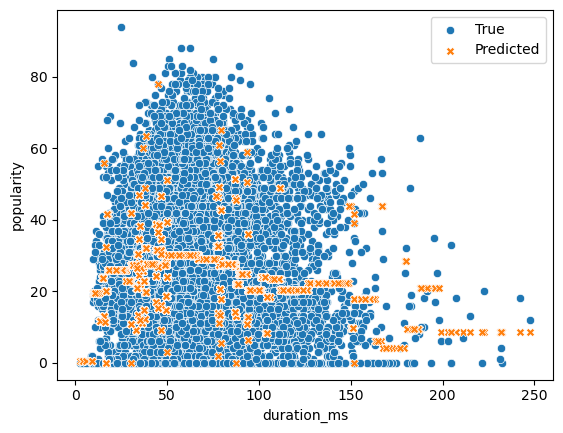

 
genre
R2: 0.298
MSE: 247.985
MAE: 11.506


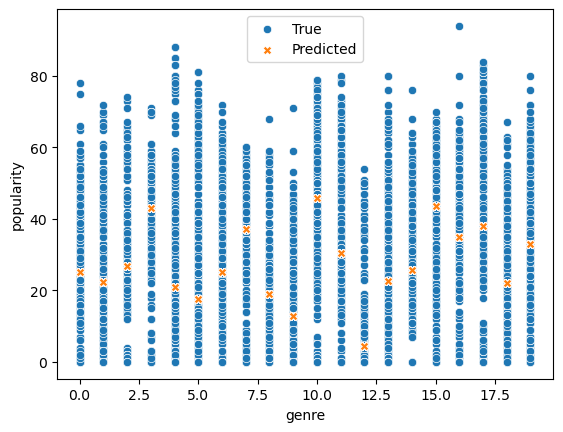

 
acousticness
R2: 0.005
MSE: 351.152
MAE: 15.368


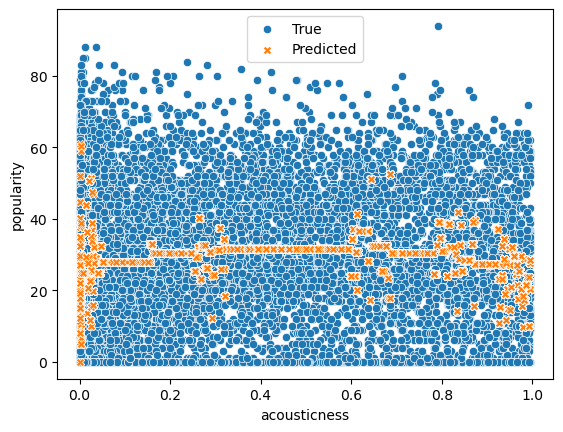

 
instrumentalness
R2: 0.076
MSE: 326.093
MAE: 14.781


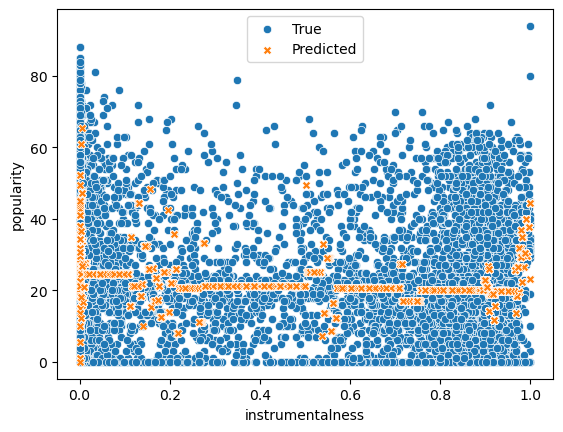

 
loudness
R2: -0.033
MSE: 364.831
MAE: 15.799


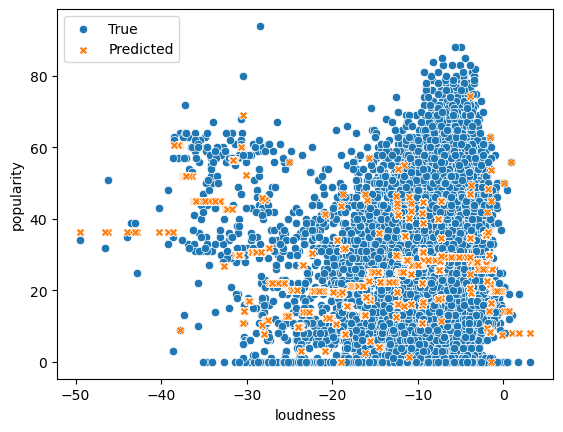

 
valence
R2: 0.015
MSE: 347.832
MAE: 15.424


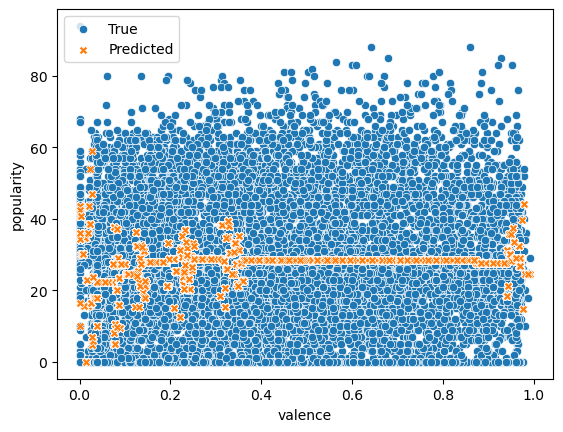

 
danceability
R2: -0.020
MSE: 360.024
MAE: 15.646


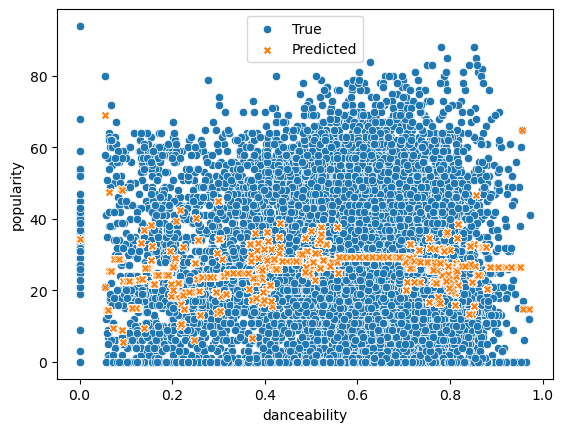

 
energy
R2: -0.015
MSE: 358.285
MAE: 15.485


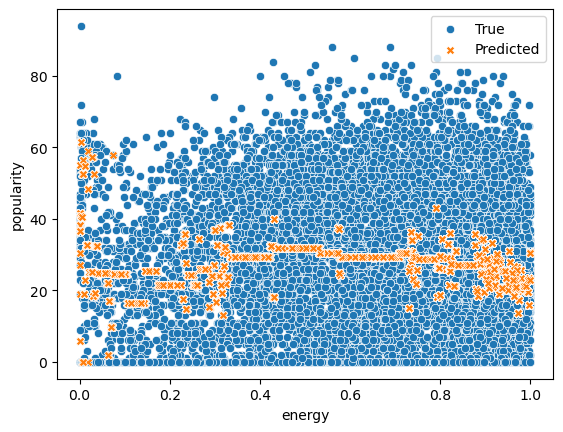

 
n_beats
R2: 0.000
MSE: 352.939
MAE: 15.585


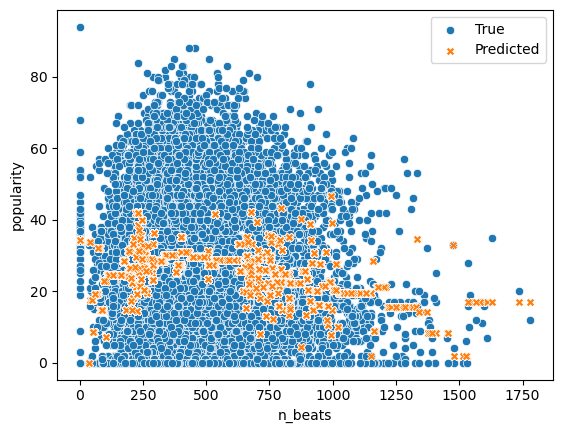

 
time_signature
R2: 0.005
MSE: 351.414
MAE: 15.656


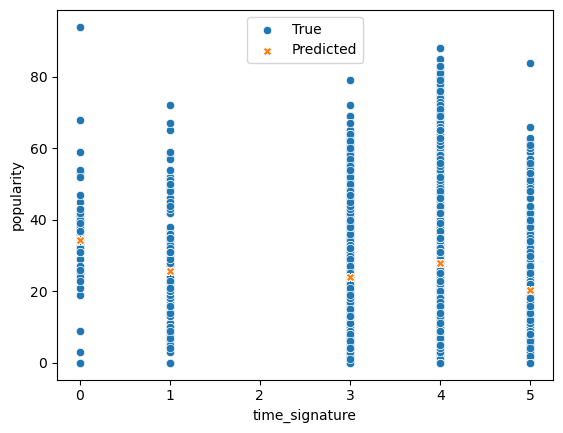

 
liveness
R2: -0.033
MSE: 364.892
MAE: 15.780


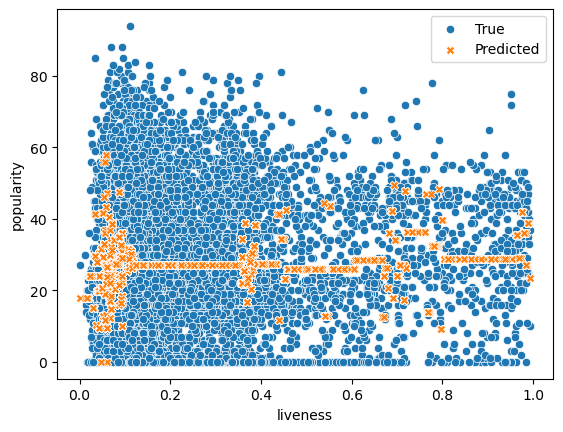

 
tempo
R2: -0.020
MSE: 360.153
MAE: 15.681


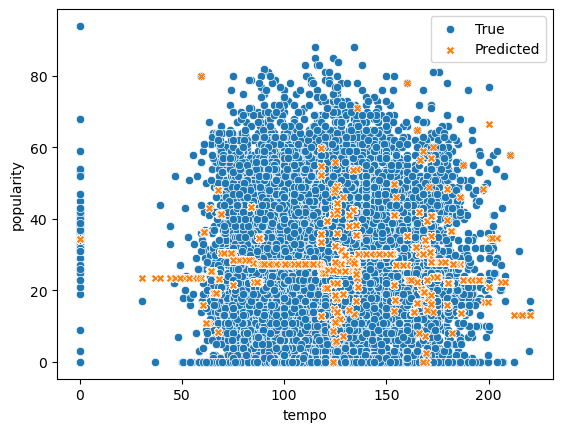

 
processing
R2: -0.001
MSE: 353.436
MAE: 15.679


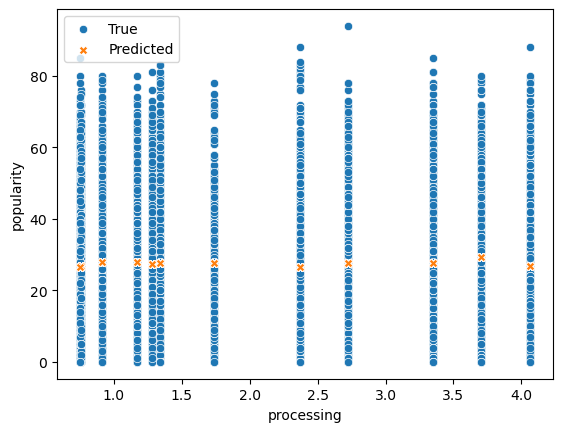

 
speechiness
R2: -0.005
MSE: 354.687
MAE: 15.518


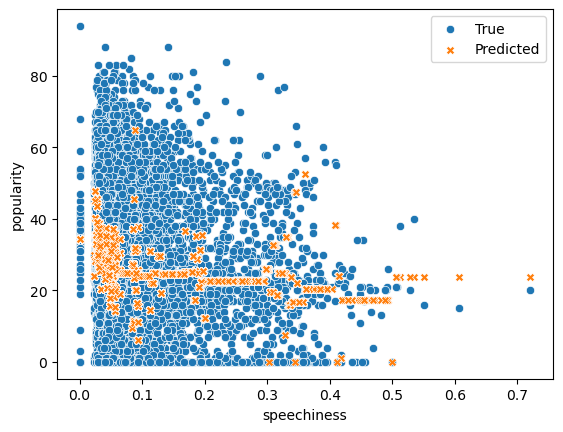

In [66]:

from sklearn.tree import DecisionTreeRegressor
columns_of_interest = [var for var in df.columns if var not in ['intervalli', 'popularity']]


for var in columns_of_interest:
    print(" ")
    print(var)
    x_train = df_train[var].values.reshape(-1, 1)
    y_train = df_train["popularity"].values

    x_test = df_test[var].values.reshape(-1, 1)
    y_test = df_test["popularity"].values
    reg = DecisionTreeRegressor(max_depth=10, random_state=4, min_samples_split= 20)
    reg.fit(x_train, y_train)
    y_pred = reg.predict(x_test)
    print('R2: %.3f' % r2_score(y_test, y_pred))
    print('MSE: %.3f' % mean_squared_error(y_test, y_pred))
    print('MAE: %.3f' % mean_absolute_error(y_test, y_pred))
    sns.scatterplot(data=df_train, x=var, y="popularity", label="True")
    sns.scatterplot(data=df_train, x=var, y=reg.predict(x_train), label="Predicted", marker="X")
    plt.legend()
    plt.show()

duration_ms:
Il coefficiente R2 è leggermente negativo, indicando che il modello non si adatta bene ai dati per questa feature. L'errore quadratico medio (MSE) e l'errore assoluto medio (MAE) sono relativamente alti, indicando che le previsioni del modello per questa feature non sono molto accurate.

genre:
Il coefficiente R2 è positivo e abbastanza alto, indicando che il modello si adatta bene ai dati per la feature "genre". L'errore quadratico medio (MSE) e l'errore assoluto medio (MAE) sono anche abbastanza bassi, indicando buone performance.

acousticness, instrumentalness, valence, n_beats, time_signature:
Queste feature hanno coefficienti R2 positivi e bassi MSE e MAE, indicando che il modello si adatta relativamente bene a queste caratteristiche.

loudness, danceability, energy, tempo, processing, speechiness:
Per queste feature, il coefficiente R2 è vicino a zero o leggermente negativo, indicando che il modello non si adatta molto bene ai dati. L'errore quadratico medio (MSE) e l'errore assoluto medio (MAE) sono più alti, indicando una precisione inferiore.

### KNN Regressor

 
duration_ms
R2: -0.199
MSE: 423.386
MAE: 16.965


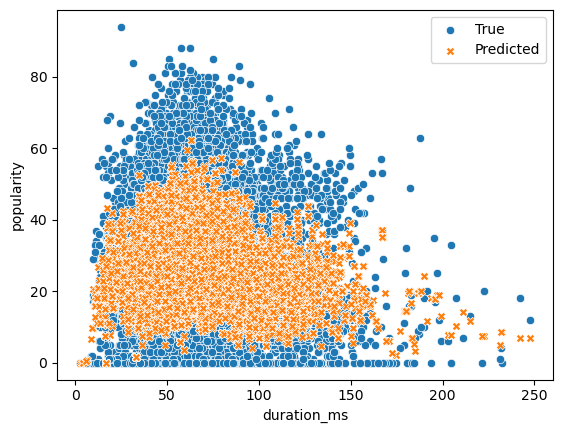

 
genre
R2: 0.188
MSE: 286.685
MAE: 12.051


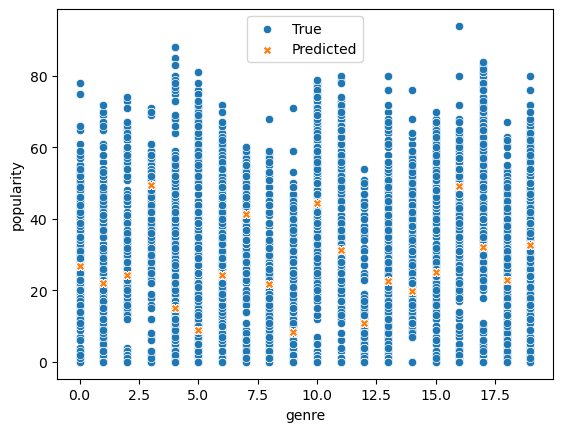

 
acousticness
R2: -0.129
MSE: 398.496
MAE: 16.238


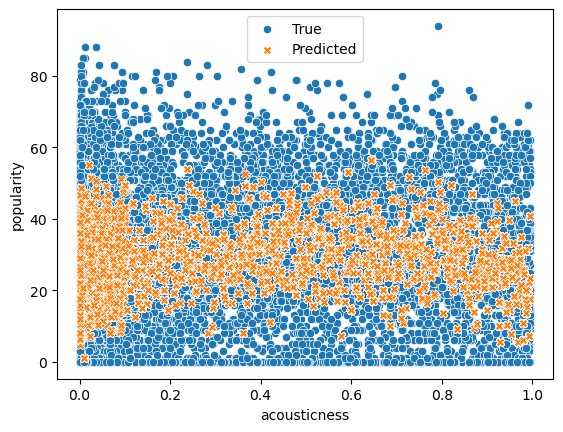

 
instrumentalness
R2: -0.038
MSE: 366.621
MAE: 15.584


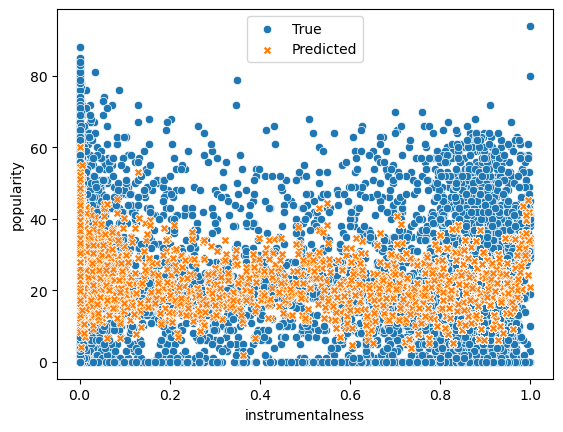

 
loudness
R2: -0.164
MSE: 410.943
MAE: 16.627


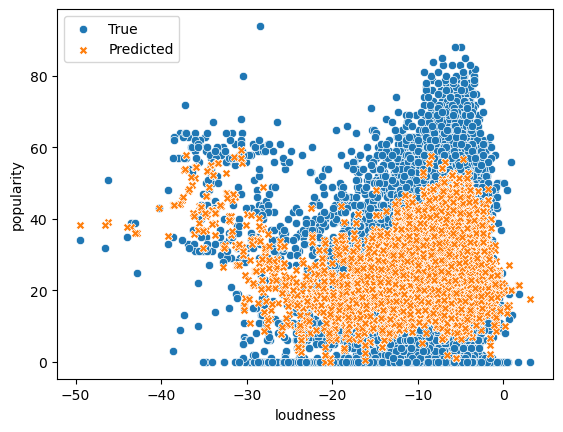

 
valence
R2: -0.136
MSE: 401.068
MAE: 16.350


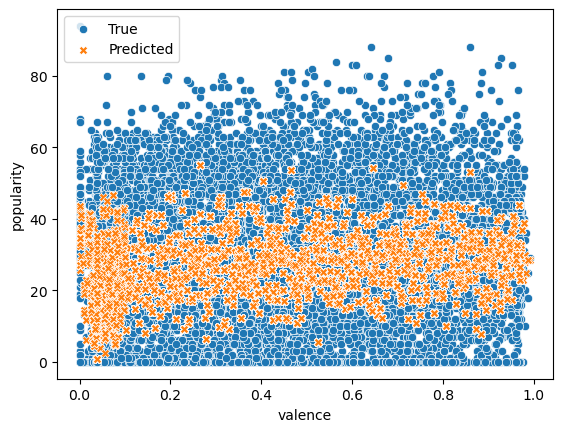

 
danceability
R2: -0.135
MSE: 400.852
MAE: 16.427


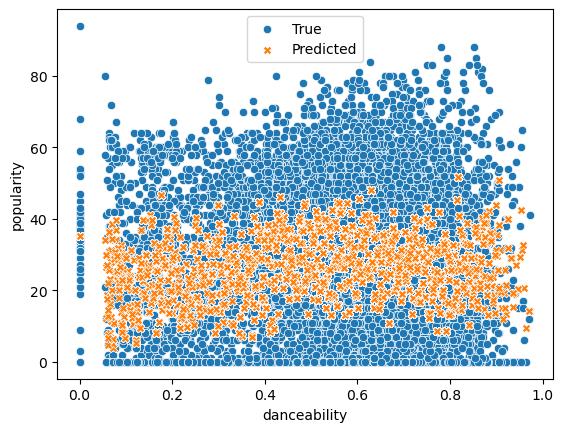

 
energy
R2: -0.189
MSE: 419.971
MAE: 16.777


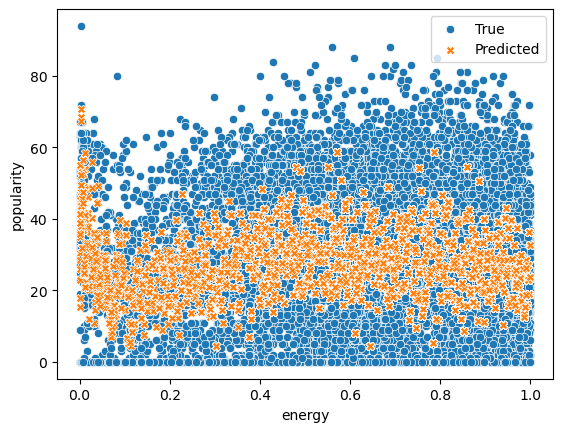

 
n_beats
R2: -0.139
MSE: 402.135
MAE: 16.404


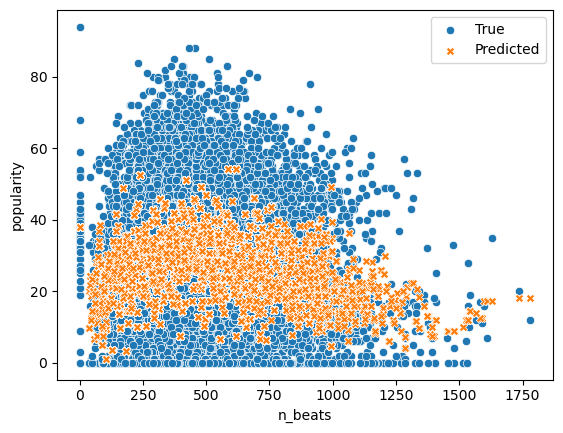

 
time_signature
R2: -0.474
MSE: 520.302
MAE: 18.080


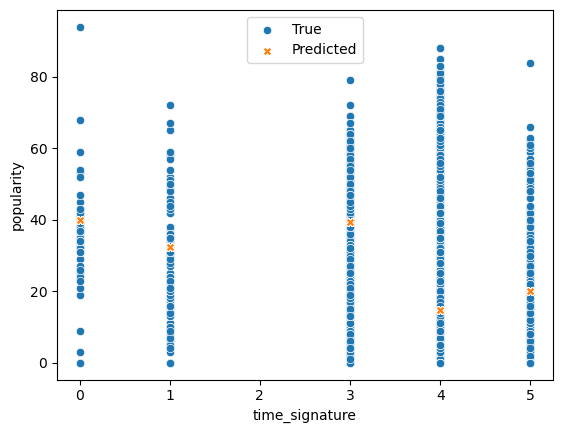

 
liveness
R2: -0.156
MSE: 408.136
MAE: 16.488


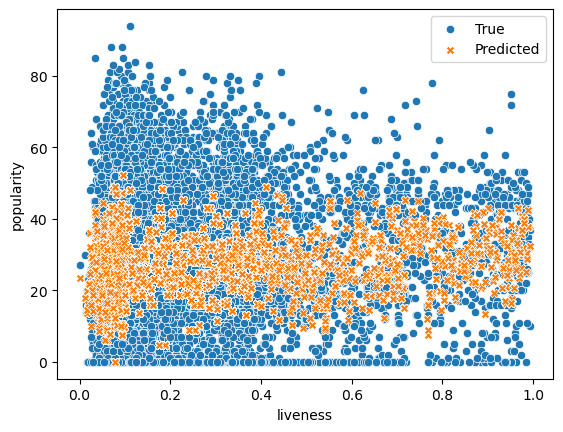

 
tempo
R2: -0.159
MSE: 409.072
MAE: 16.533


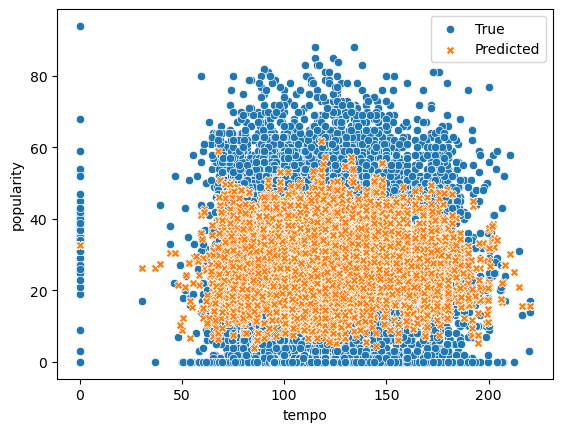

 
processing
R2: -0.100
MSE: 388.531
MAE: 16.329


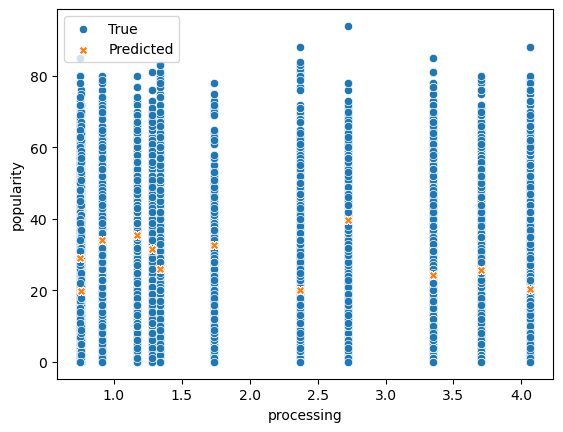

 
speechiness
R2: -0.158
MSE: 408.865
MAE: 16.435


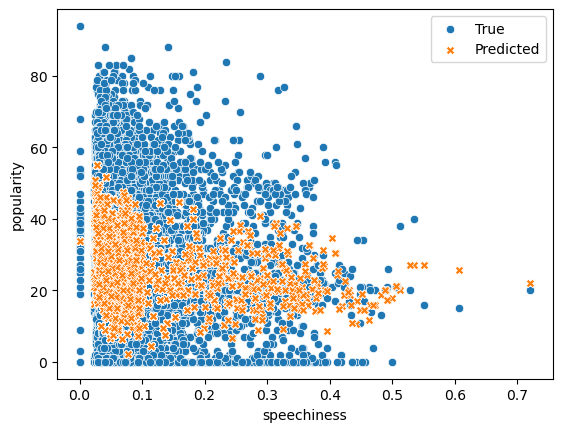

In [68]:
from sklearn.neighbors import KNeighborsRegressor


from sklearn.tree import DecisionTreeRegressor
columns_of_interest = [var for var in df.columns if var not in ['intervalli', 'popularity']]


for var in columns_of_interest:
    print(" ")
    print(var)
    x_train = df_train[var].values.reshape(-1, 1)
    y_train = df_train["popularity"].values

    x_test = df_test[var].values.reshape(-1, 1)
    y_test = df_test["popularity"].values

    reg = KNeighborsRegressor()
    reg.fit(x_train, y_train)
    y_pred = reg.predict(x_test)
    print('R2: %.3f' % r2_score(y_test, y_pred))
    print('MSE: %.3f' % mean_squared_error(y_test, y_pred))
    print('MAE: %.3f' % mean_absolute_error(y_test, y_pred))
    sns.scatterplot(data=df_train, x=var, y="popularity", label="True")
    sns.scatterplot(data=df_train, x=var, y=reg.predict(x_train), label="Predicted", marker="X")
    plt.legend()
    plt.show()

duration_ms:

R2: -0.199: Il coefficiente di determinazione è negativo, indicando che il modello KNN non è in grado di spiegare la variazione nella variabile target in modo significativo. Potrebbe essere necessario rivalutare la scelta di questa variabile o esplorare approcci alternativi.
genre:

R2: 0.188: Il coefficiente di determinazione è positivo, indicando che il modello spiega in parte la variazione nella variabile target (genre). Tuttavia, è importante valutare se il livello di spiegazione è sufficiente per le tue esigenze.
Altre feature:

Le metriche R2 per le altre feature variano, ma in generale, sono relativamente basse o negative. Questo suggerisce che il modello KNN potrebbe non essere il migliore per la tua configurazione di dati o che potrebbe essere necessario un miglioramento dell'addestramento del modello.
MSE (Mean Squared Error) e MAE (Mean Absolute Error):

Entrambe le metriche MSE e MAE sono elevate, indicando che il modello KNN ha una buona quantità di errore nella previsione della variabile target per molte delle feature.

# Multiple Regression

## Linear Regression

In [77]:
att = [var for var in df.columns if var not in ['intervalli', 'popularity']]
X_train = df_train[att].values
y_train = df_train["popularity"].values

X_test = df_test[att].values
y_test = df_test["popularity"].values
reg = LinearRegression()
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
print('R2: %.3f' % r2_score(y_test, y_pred))
print('MSE: %.3f' % mean_squared_error(y_test, y_pred))
print('MAE: %.3f' % mean_absolute_error(y_test, y_pred))


R2: 0.108
MSE: 314.848
MAE: 14.496


## Nonlinear Regression

In [79]:
reg = DecisionTreeRegressor(max_depth=10, random_state=4, min_samples_split= 20)
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
print('R2: %.3f' % r2_score(y_test, y_pred))
print('MSE: %.3f' % mean_squared_error(y_test, y_pred))
print('MAE: %.3f' % mean_absolute_error(y_test, y_pred))

R2: 0.239
MSE: 268.632
MAE: 11.665


In [81]:
import matplotlib.pyplot as plt
import seaborn as sns

# Supponiamo che X e y siano i tuoi dati
# Sostituisci questi con i tuoi dati reali
att = [var for var in df.columns if var not in ['intervalli', 'popularity']]
X = df[att]
y = df['popularity']

# Creazione di un grafico di dispersione
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X, y=y)
plt.title('Grafico di Dispersione')
plt.xlabel('Variabile Indipendente')
plt.ylabel('Variabile Dipendente')
plt.show()


ValueError: Data must be 1-dimensional

<Figure size 1000x600 with 0 Axes>

In [ ]:
import plotly.express as px
import pandas as pd
from sklearn.inspection import partial_dependence, plot_partial_dependence

# Supponiamo che clf sia il tuo modello addestrato
# Sostituisci questo con il tuo modello reale
clf = ...

# Supponiamo che X sia il tuo set di dati di input
# Sostituisci questo con il tuo set di dati reale
X = ...

# Calcolo degli effetti parziali
features = [0, 1]  # Sostituisci con gli indici delle variabili per le quali vuoi calcolare gli effetti parziali
pdp, axes = partial_dependence(clf, X, features=features)

# Creazione di grafici di effetti parziali con Plotly
fig = plot_partial_dependence(clf, X, features=features, grid_resolution=50)
fig.show()
